In [40]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [41]:
import sys
from pathlib import Path
from datetime import date

import pandas as pd
import numpy as np
from sklearn import metrics

import matplotlib.pyplot as plt
import plotly.express as px
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 600

In [42]:
plt.rcParams['svg.fonttype'] = 'none'

## general configuration

In [43]:
repo_dir = '/home/labs/amit/noamsh/repos/CAR_T'
sys.path.append(repo_dir)
data_dir_path = Path(repo_dir, "data")

In [44]:
figures_dir = Path(data_dir_path, "figures", date.today().isoformat())
figures_dir.mkdir(parents=True, exist_ok=True)

In [45]:
figures_dir

PosixPath('/home/labs/amit/noamsh/repos/CAR_T/data/figures/2024-05-26')

## exp results loading

In [46]:
from evaluation.experiment_managment import load_results_of_exp_name, generate_experiment_name

In [47]:
exps_dict = {
    "Cellular frequencies": load_results_of_exp_name(generate_experiment_name(use_cell_frequencies=True), from_dir=data_dir_path),
    "TNFa-CD16": load_results_of_exp_name(generate_experiment_name(use_TNFA_SIGNALING_VIA_NFKB_CD16_Mono=True), from_dir=data_dir_path),
    "Combined_TNFa": load_results_of_exp_name(generate_experiment_name(use_cell_frequencies=True, use_TNFA_SIGNALING_VIA_NFKB_CD16_Mono=True), from_dir=data_dir_path),
}

## plot per experiment visualization

In [48]:
from evaluation.visualizations import plot_ROC_PRauc_CM_stem

In [49]:
def print_metrics(y_true, y_score):
    report = metrics.classification_report(y_true, y_score, output_dict=True)
    print_report = {
        "R precision": round(report['1']['precision'], 3),
        "NR precision": round(report['0']['precision'], 3),
        'accuracy': round(report['accuracy'],3)
    }
    print_repors_list = [f"{k}: {v}" for k,v in print_report.items()]
    print("\n".join(print_repors_list))

In [50]:
patient_name_map = exps_dict["Cellular frequencies"]['patient_map'].set_index("patient")["sample_name"]

features: Index(['B', 'CD4.CM', 'CD4.EM', 'CD4.Naive', 'CD8.CM', 'CD8.EM', 'CD8.naive',
       'Cycling', 'MAIT', 'NK.bright', 'NK.dim', 'Tregs', 'CD14 Mono',
       'CD16 Mono', 'DCs', 'Inter Mono', 'pDC', 'B_category', 'CD4 T', 'CD8 T',
       'Myeloid', 'NK', 'NKT'],
      dtype='object')
Cellular frequencies: loocv
model: LogisticRegression(C=7.67096798195359, class_weight='balanced', penalty='l1',
                   solver='liblinear')
R precision: 0.909
NR precision: 0.55
accuracy: 0.738


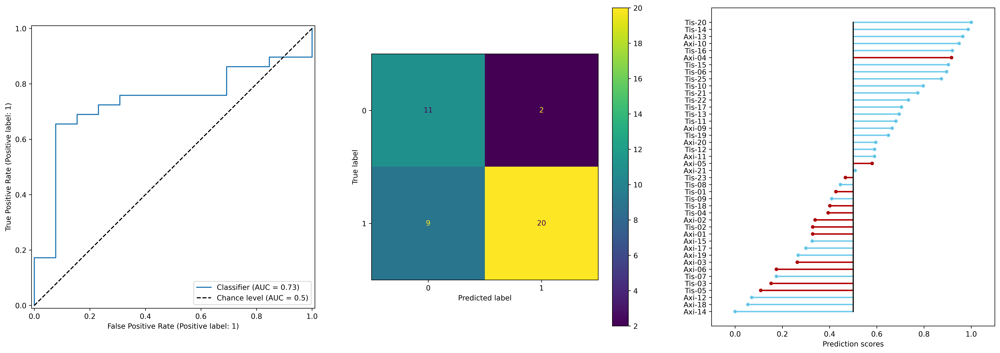

features: Index(['HALLMARK_TNFA_SIGNALING_VIA_NFKB-CD16 Mono'], dtype='object')
TNFa-CD16: loocv
model: RandomForestClassifier(max_depth=2, max_samples=0.8, n_estimators=20)
R precision: 0.9
NR precision: 0.833
accuracy: 0.881


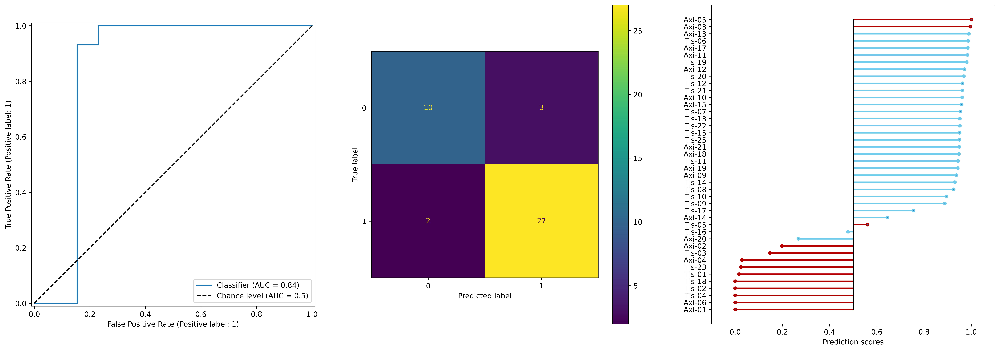

features: Index(['HALLMARK_TNFA_SIGNALING_VIA_NFKB-CD16 Mono', 'B', 'CD4.CM', 'CD4.EM',
       'CD4.Naive', 'CD8.CM', 'CD8.EM', 'CD8.naive', 'Cycling', 'MAIT',
       'NK.bright', 'NK.dim', 'Tregs', 'CD14 Mono', 'CD16 Mono', 'DCs',
       'Inter Mono', 'pDC', 'B_category', 'CD4 T', 'CD8 T', 'Myeloid', 'NK',
       'NKT'],
      dtype='object')
Combined_TNFa: loocv
model: LogisticRegression(C=0.29000665574146073, penalty='l1', solver='liblinear')
R precision: 0.875
NR precision: 0.9
accuracy: 0.881


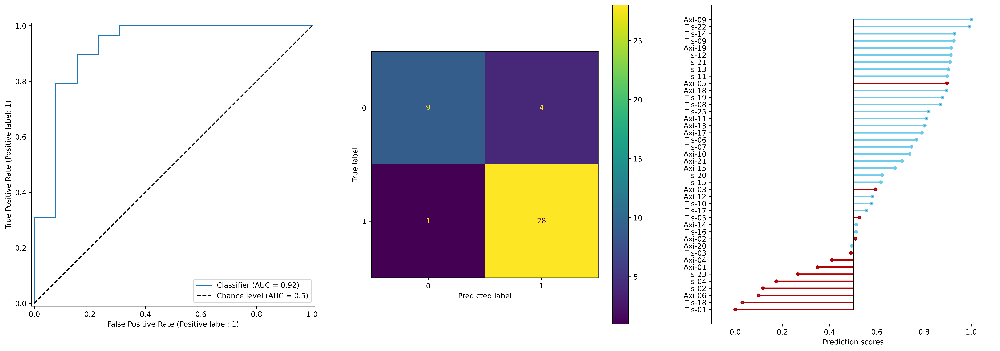

In [51]:
for exp_name, results in exps_dict.items():
    print(f"features: {results['test']['X_train'].columns}")
    for eval_key in ['loocv']: #, 'test'
        y_true = results[eval_key]["y"].rename(index=patient_name_map)
        y_pred = np.array(results[eval_key]["y_pred"])
        y_proba =  np.array(results[eval_key]["y_proba"])

        exp_full_name = f"{exp_name}: {eval_key}"
        print(exp_full_name)
        print(f"model: {results['model']}")
        print_metrics(y_true, y_pred)

        image_path= Path(figures_dir, f"{exp_full_name.replace(':','').replace(' ', '_')}.svg")
        plot_ROC_PRauc_CM_stem(y_true, y_pred, y_proba, flip_stem=True, save_figure_to_path=image_path, use_all_score_range=True)

## plot shape value

In [52]:
import shap

def print_shap_plots(model, X, save_figure_to_path=None):
    try: # tree
        explainer = shap.TreeExplainer(model)
    except:
        try: # kernel
            explainer = shap.Explainer(model, X) 
        except:
            explainer = shap.KernelExplainer(model.predict, X)
    shap_values = explainer(X)
    if len(shap_values.shape) >2:
        shap_values = shap_values[:,:,1]
    # shap.plots.beeswarm(shap_values)
    shap.plots.bar(shap_values, max_display=5)
    if save_figure_to_path is not None:
        plt.savefig(save_figure_to_path, format="pdf")
    return shap_values


Cellular frequencies: train shap values


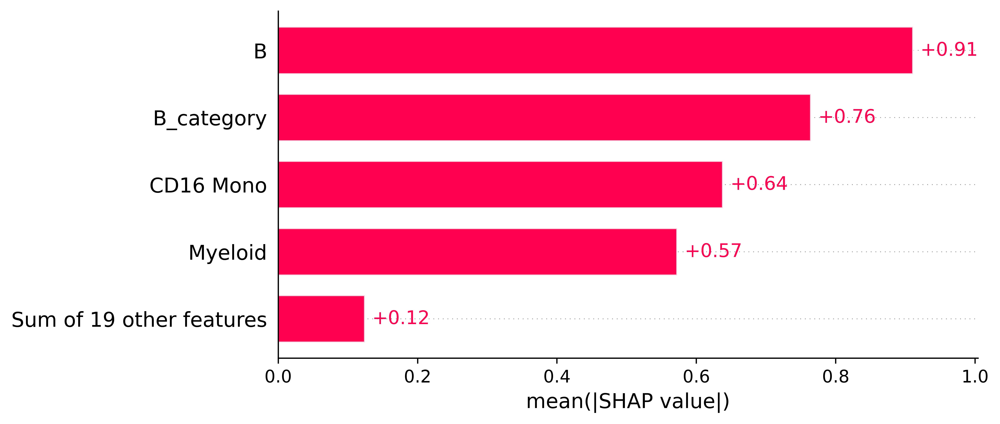

Cellular frequencies: test shap values


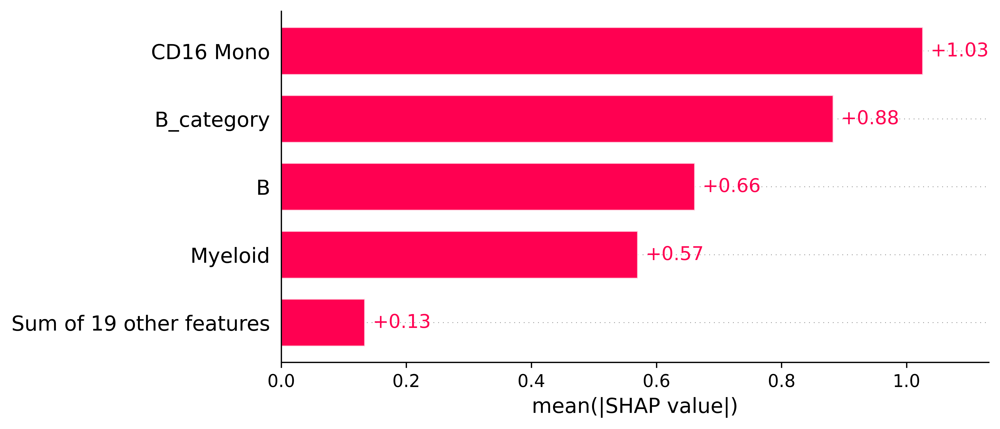

TNFa-CD16: train shap values


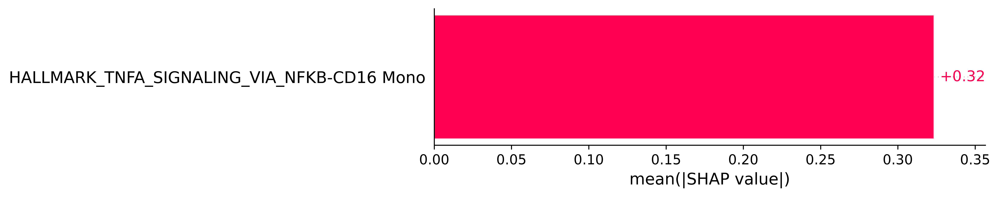

TNFa-CD16: test shap values


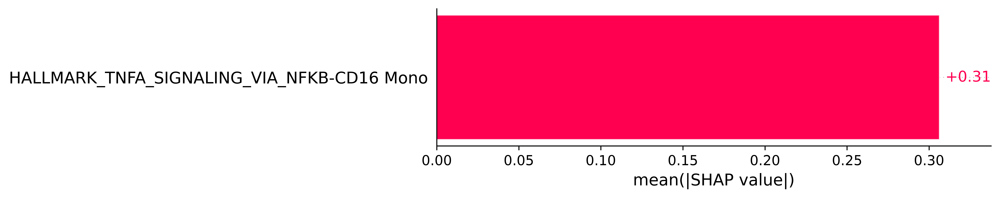

Combined_TNFa: train shap values


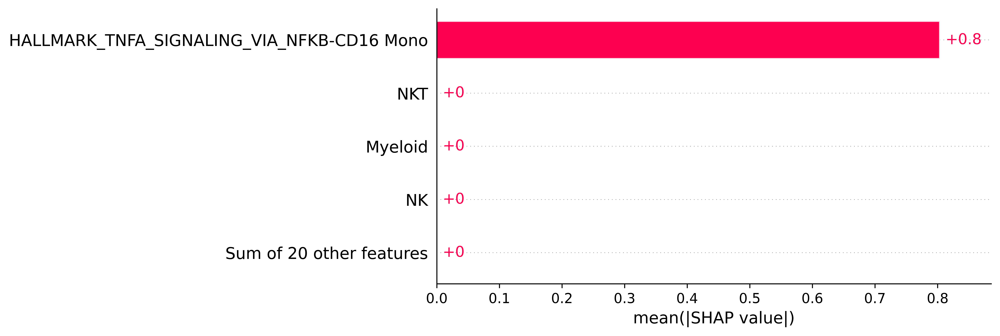

Combined_TNFa: test shap values


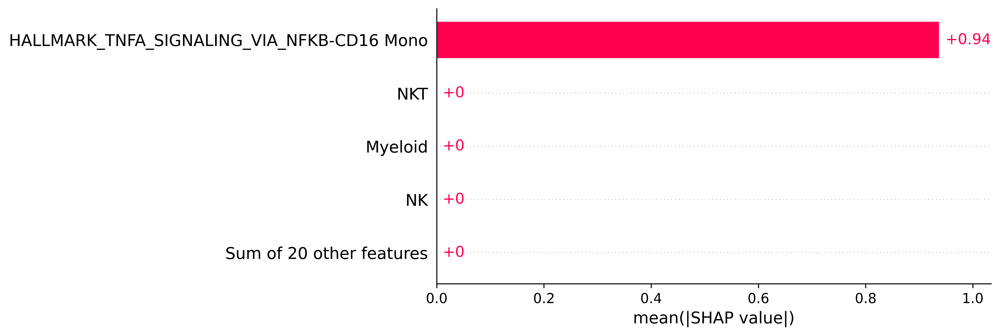

In [53]:
for exp_name, results in exps_dict.items():
    model = results["model"]
    X_train = results['test']["X_train"]
    y_train = results['y'].loc[X_train.index]
    model.fit(X_train ,y_train)

    print(f"{exp_name}: train shap values")
    _ = print_shap_plots(model, X_train)
    print(f"{exp_name}: test shap values")
    image_path = Path(figures_dir, f"{exp_name}_test_shap.pdf")
    _ = print_shap_plots(model, results['test']["X_test"]) #, save_figure_to_path=image_path)

## plot combined ROC curve

In [54]:
from evaluation.visualizations import plot_loocv_roc_curves

In [55]:
exp_names_to_plot = {
    "Cellular frequencies": "Cellular frequencies",
    "TNFa-CD16":  "Myeloid pathway",
    "Combined_TNFa": "Combined",
}

### figures

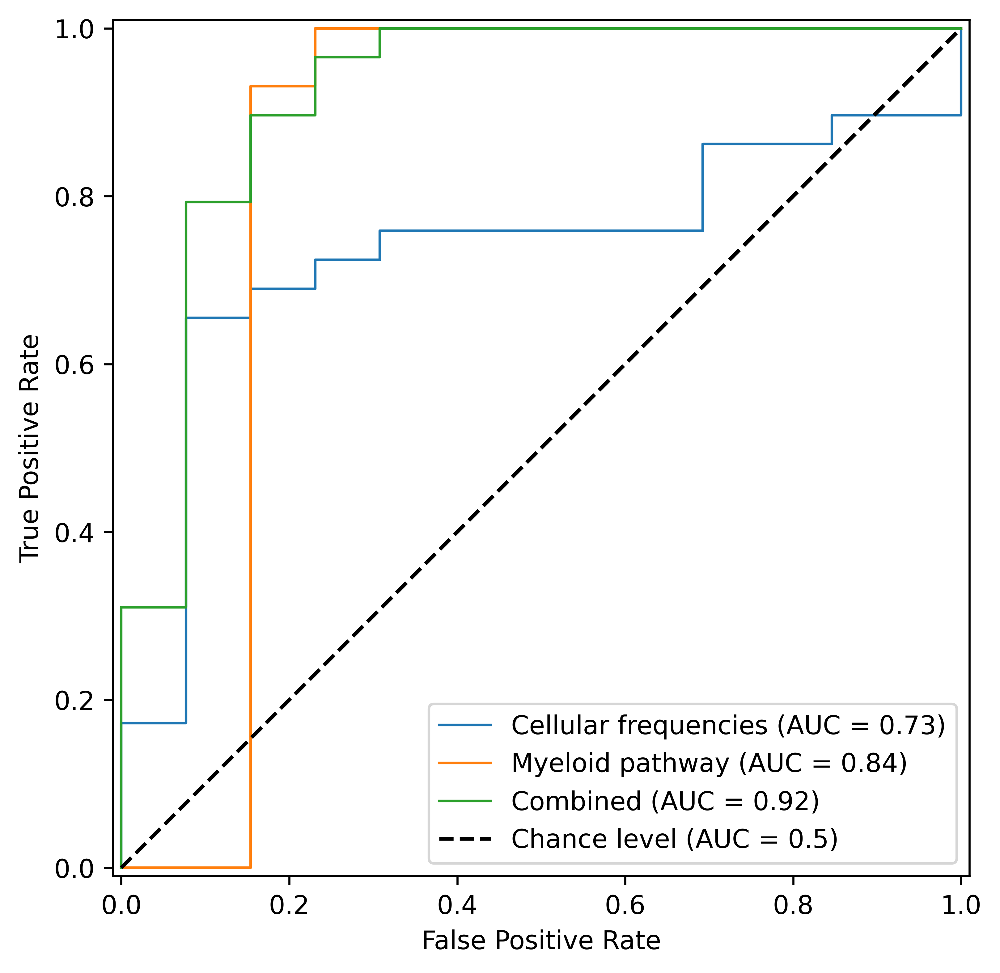

In [56]:
plot_loocv_roc_curves(exps_dict, exp_names_to_plot, Path(figures_dir, f"ROC_curve_no_mon_ratio.svg"))

## external evaluation

haradvala: Cellular frequencies
features: Index(['CD16 Mono', 'CD4.Naive', 'CD14 Mono', 'Cycling', 'CD8.EM', 'CD4.EM',
       'CD8.CM', 'NK.bright', 'DCs', 'NKT', 'NK.dim', 'B', 'CD8.naive',
       'Tregs', 'Inter Mono', 'pDC', 'Myeloid'],
      dtype='object')


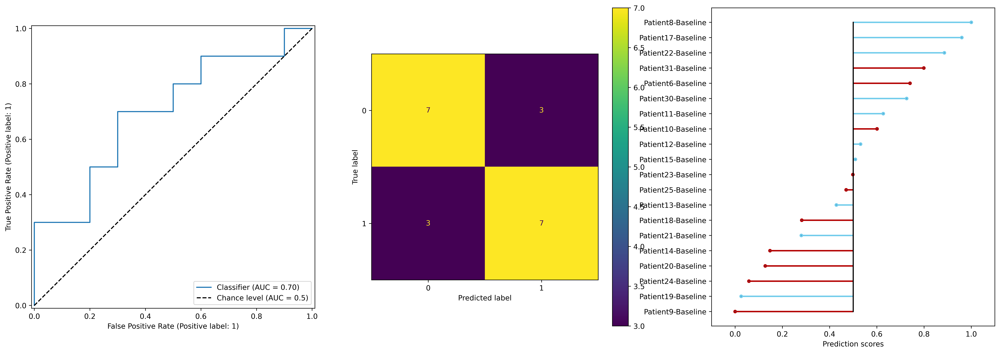

haradvala: TNFa-CD16
features: Index(['HALLMARK_TNFA_SIGNALING_VIA_NFKB-CD16 Mono'], dtype='object')


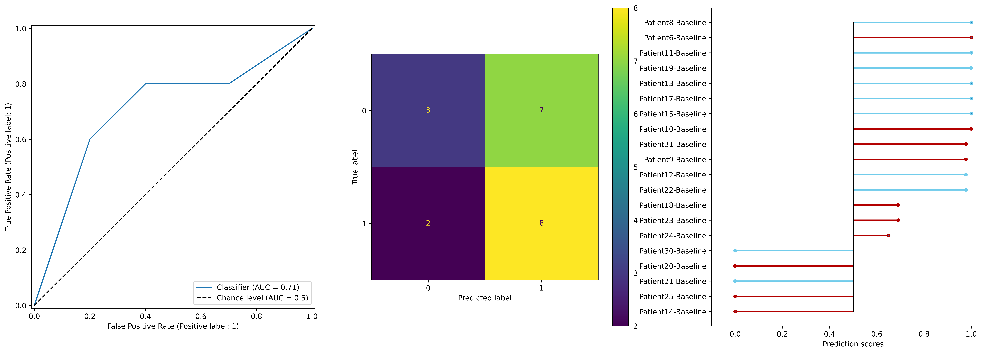

haradvala: Combined_TNFa
features: Index(['CD16 Mono', 'HALLMARK_TNFA_SIGNALING_VIA_NFKB-CD16 Mono', 'CD4.Naive',
       'CD14 Mono', 'Cycling', 'CD8.EM', 'NK.bright', 'CD8.CM', 'CD4.EM',
       'NKT', 'DCs', 'B', 'NK.dim', 'Tregs', 'Myeloid', 'Inter Mono', 'pDC',
       'CD8.naive'],
      dtype='object')


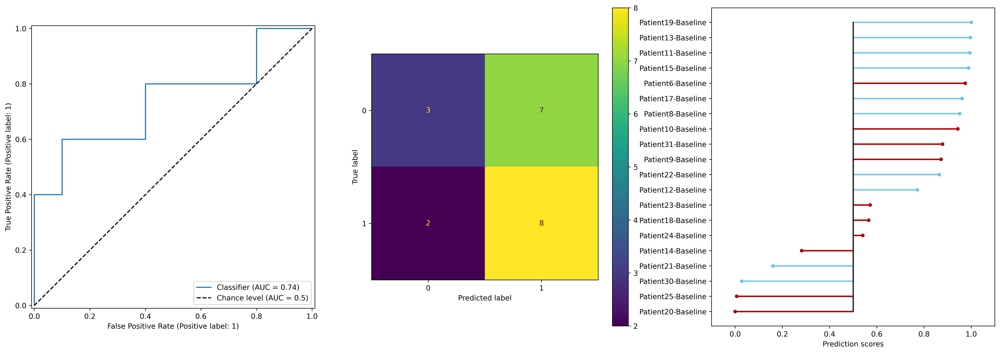

In [57]:
for exp_name, results in exps_dict.items():
    if exp_name not in ["Combined", "Myeloid pathways"]: # no 
        print(f"haradvala: {exp_name}")
        X_train = results['external_eval']['X_train']
        if X_train is not None:
            print(f"features: {results['external_eval']['X_train'].columns}")
            y_true = results['external_eval']["y"]
            y_pred = np.array(results['external_eval']["y_pred"])
            y_proba =  np.array(results['external_eval']["y_proba"])
    
            image_path= Path(figures_dir, f"haradvala_{exp_name}.svg")
            plot_ROC_PRauc_CM_stem(y_true, y_pred, y_proba, flip_stem=True, save_figure_to_path=image_path, use_all_score_range=True)

### shap

Cellular frequencies: internal shap values


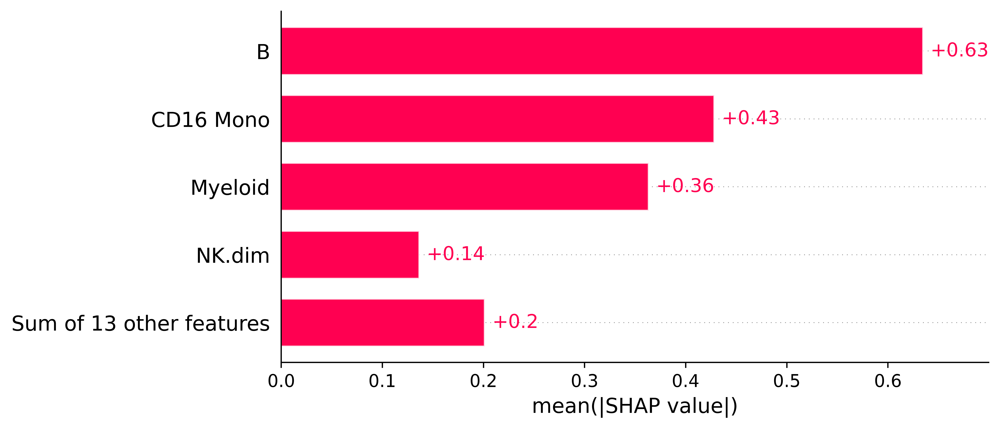

Cellular frequencies: haradvala shap values


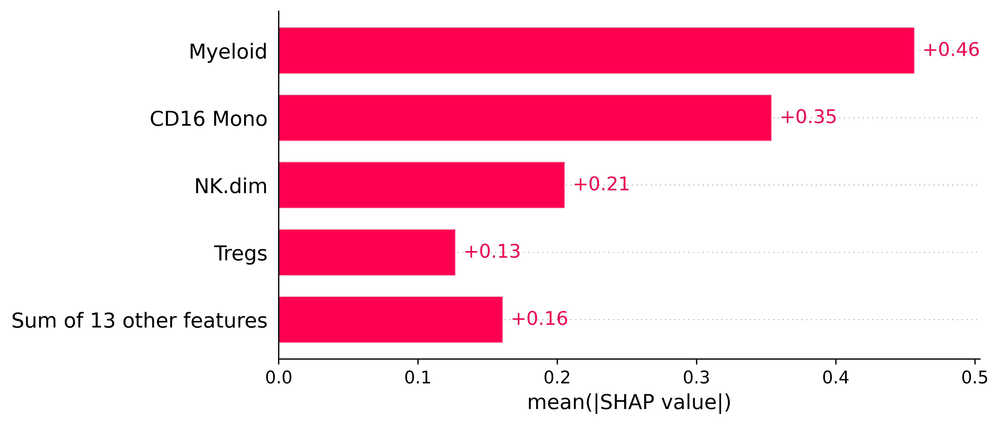

TNFa-CD16: internal shap values


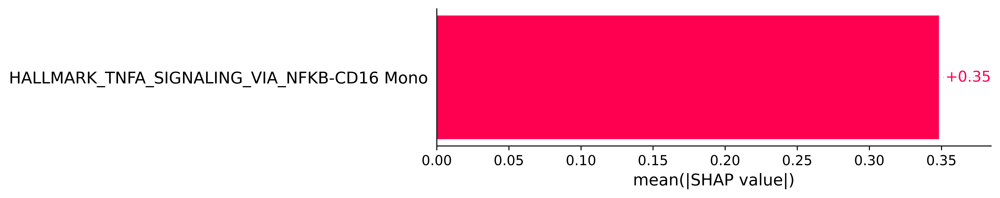

TNFa-CD16: haradvala shap values


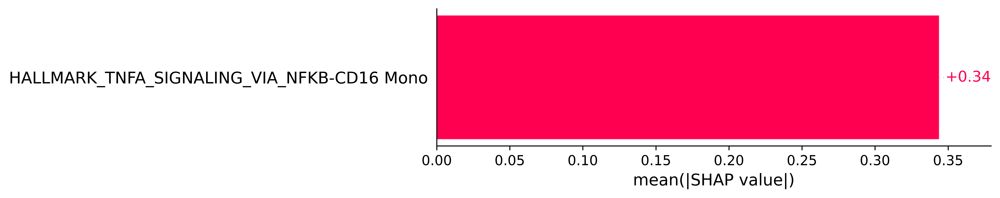

Combined_TNFa: internal shap values


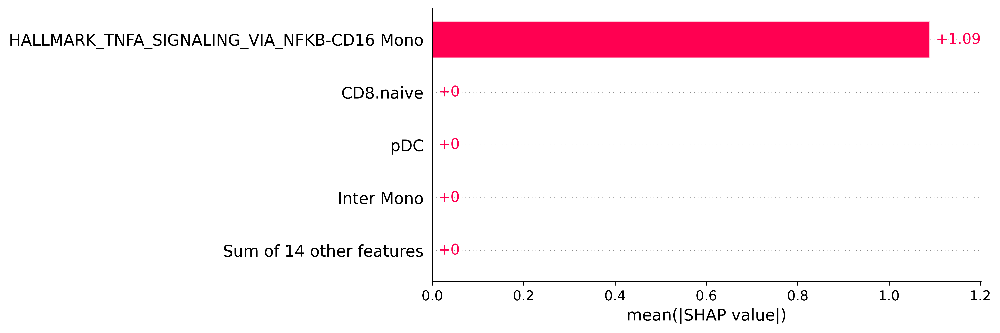

Combined_TNFa: haradvala shap values


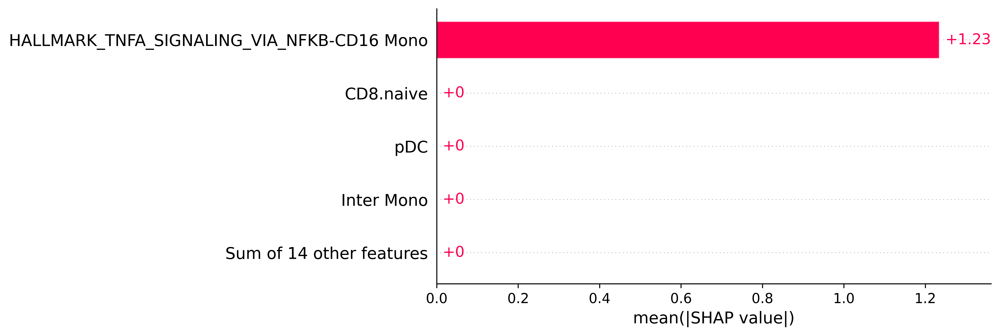

In [58]:
for exp_name, results in exps_dict.items():
    if exp_name not in ["Combined",  "Combined Mono ratio", "Myeloid pathways"]:
        model = results["model"]
        X_train = results['external_eval']["X_train"]
        y_train = results['y']
        model.fit(X_train ,y_train)
    
        print(f"{exp_name}: internal shap values")
        _ = print_shap_plots(model, X_train)
        print(f"{exp_name}: haradvala shap values")
        # image_path = Path(figures_dir, f"{exp_name}_test_shap.pdf")
        _ = print_shap_plots(model, results['external_eval']["X_test"]) #, save_figure_to_path=image_path)

## final metrics table

In [59]:
from sklearn.metrics import roc_auc_score
all_metrics = []
for i, (exp_name, new_exp_name) in enumerate(exp_names_to_plot.items()):
    for dataset in ['loocv', 'external_eval']:
        results = exps_dict[exp_name]
        y_true = results[dataset]["y"]
        y_pred = np.array(results[dataset]["y_pred"])
        y_score = np.array(results[dataset]["y_proba"])
        
        report = metrics.classification_report(y_true, y_pred, output_dict=True)
        report_metrics = {
            "R precision": round(report['1']['precision'], 2),
            "NR precision": round(report['0']['precision'], 2),
            'accuracy': round(report['accuracy'],2)
        }
        report_metrics["ROC AUC"] = round(roc_auc_score(y_true, y_score), 2)
        report_metrics["experiment name"] = new_exp_name
        report_metrics["dataset"] = 'external evaluation' if dataset == 'external_eval' else 'internal evaluation'
        all_metrics.append(report_metrics)
    

In [60]:
summary_df = pd.DataFrame(all_metrics).groupby(by=['experiment name', 'dataset']).max()
summary_df

R precision  NR precision  accuracy  \
experiment name      dataset                                                    
Cellular frequencies external evaluation         0.70          0.70      0.70   
                     internal evaluation         0.91          0.55      0.74   
Combined             external evaluation         0.53          0.60      0.55   
                     internal evaluation         0.88          0.90      0.88   
Myeloid pathway      external evaluation         0.53          0.60      0.55   
                     internal evaluation         0.90          0.83      0.88   

                                          ROC AUC  
experiment name      dataset                       
Cellular frequencies external evaluation     0.70  
                     internal evaluation     0.73  
Combined             external evaluation     0.74  
                     internal evaluation     0.92  
Myeloid pathway      external evaluation     0.71  
                     internal evaluation     0.84

In [61]:
summary_df.to_csv(Path(figures_dir, "models_metrics_table.csv"))

## orgenize dataset for export

In [62]:
comp_pathways_results = exps_dict['Combined_TNFa']
comp_results = exps_dict['Cellular frequencies']

In [63]:
full_df = pd.concat([
    comp_pathways_results["X"].drop(columns="NK"),
    comp_results["X"],
    comp_pathways_results["y"],
    comp_pathways_results["loocv"]["y_proba"]
]  ,axis=1)
full_df = full_df.loc[:,~full_df.columns.duplicated()].copy()
full_df = full_df.rename(columns={"response_3m": "label {1:R, 0:NR}", 0: "y_pred"}).rename(index=patient_name_map)
full_df['B_category'] = -1 * full_df['B_category']
full_df.columns

Index(['HALLMARK_TNFA_SIGNALING_VIA_NFKB-CD16 Mono', 'B', 'CD4.CM', 'CD4.EM',
       'CD4.Naive', 'CD8.CM', 'CD8.EM', 'CD8.naive', 'Cycling', 'MAIT',
       'NK.bright', 'NK.dim', 'Tregs', 'CD14 Mono', 'CD16 Mono', 'DCs',
       'Inter Mono', 'pDC', 'B_category', 'CD4 T', 'CD8 T', 'Myeloid', 'NKT',
       'NK', 'label {1:R, 0:NR}', 'y_pred'],
      dtype='object')

In [64]:
wanted_columns = ['label {1:R, 0:NR}', 'y_pred', "HALLMARK_TNFA_SIGNALING_VIA_NFKB-CD16 Mono", 'B_category', 'B', 'CD4 T', 'CD8 T', 'Myeloid', 'NK','Tregs', 'CD14 Mono', 'CD16 Mono']
partial_df = full_df[wanted_columns]
partial_df

,"label {1:R, 0:NR}",y_pred,HALLMARK_TNFA_SIGNALING_VIA_NFKB-CD16 Mono,B_category,B,CD4 T,CD8 T,Myeloid,NK,Tregs,CD14 Mono,CD16 Mono
Axi-01,0,0.351162,0.771438,0,0.00000,0.21345,0.35798,0.34853,0.08004,0.02048,0.80223,0.04625
Axi-02,0,0.507890,0.324082,0,0.00053,0.12441,0.28519,0.50079,0.08909,0.01903,0.75158,0.16737
Axi-03,0,0.579606,0.127966,0,0.00201,0.16304,0.36836,0.41787,0.04871,0.04927,0.68304,0.14933
Axi-04,0,0.410426,0.596658,0,0.01039,0.33506,0.35195,0.23377,0.06883,0.07560,0.49444,0.36111
Axi-05,0,0.832456,-0.635481,0,0.00358,0.03941,0.09007,0.75947,0.10747,0.00648,0.60175,0.21765
Axi-06,0,0.106557,1.778359,0,0.01330,0.29186,0.22770,0.42254,0.04460,0.08183,0.71852,0.04074
Axi-09,1,0.918645,-1.359438,0,0.00000,0.47186,0.30778,0.15090,0.06946,0.02116,0.37302,0.25397
Axi-10,1,0.700268,-0.309055,-1,0.00781,0.05577,0.42777,0.37256,0.13608,0.00540,0.57784,0.26048
Axi-11,1,0.760129,-0.512195,0,0.00305,0.07990,0.31247,0.24275,0.36183,0.01417,0.55975,0.20335
Axi-12,1,0.567740,0.063197,0,0.00062,0.04224,0.18385,0.65839,0.11491,0.00911,0.76509,0.06792


In [65]:
full_df.to_csv(Path(figures_dir, "all_fetures_prediction_labels.csv"))
partial_df.to_csv(Path(figures_dir, "partial_fetures_prediction_labels.csv"))